In [1]:
# Note: some of the code are copied from Kaggle's lessons

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('./'):
    for filename in filenames:
#         print(os.path.join(dirname, filename))
        pass

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_absolute_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import SelectFromModel
from scipy import signal

from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import lightgbm as lgb
from sklearn.ensemble import GradientBoostingRegressor

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from IPython.display import display, HTML

In [3]:
# Files 
GSPC_path='./data/^GSPC.csv'
can_unemp_path='./data/can_unempemp.csv'
us_unemp_path='./data/us_UNRATE.csv'
DJI_path='./data/^DJI.csv'
FVX_path='./data/^FVX.csv'
GSPTSE_path='./data/^GSPTSE.csv'
IRX_path='./data/^IRX.csv'
IXIC_path='./data/^IXIC.csv'
N225_path='./data/^N225.csv'
TNX_path='./data/^TNX.csv'
TYX_path='./data/^TYX.csv'
usGDP_path='./data/usGDP.csv'
non_farm_path='./data/non_farm.csv'
us_CPI_path='./data/OECD_CPI_Total_All_Items.csv'

In [4]:
GSPC = pd.read_csv(GSPC_path, index_col='Date',parse_dates=True)
can_unemp = pd.read_csv(can_unemp_path, index_col='Date',parse_dates=True)
us_unemp = pd.read_csv(us_unemp_path, index_col='DATE',parse_dates=True)

DJI = pd.read_csv(DJI_path, index_col='Date',parse_dates=True)
FVX = pd.read_csv(FVX_path, index_col='Date',parse_dates=True)
GSPTSE = pd.read_csv(GSPTSE_path, index_col='Date',parse_dates=True)
IRX = pd.read_csv(IRX_path, index_col='Date',parse_dates=True)
IXIC = pd.read_csv(IXIC_path, index_col='Date',parse_dates=True)
N225 = pd.read_csv(N225_path, index_col='Date',parse_dates=True)
TNX = pd.read_csv(TNX_path, index_col='Date',parse_dates=True)
TYX = pd.read_csv(TYX_path, index_col='Date',parse_dates=True)

usGDP = pd.read_csv(usGDP_path, index_col='DATE',parse_dates=True)
non_farm = pd.read_csv(non_farm_path, index_col='DATE',parse_dates=True)
us_CPI = pd.read_csv(us_CPI_path, index_col='DATE',parse_dates=True)


In [5]:
def stock_use_close_value(df):
    headers_to_drop=['Open', 'High','Low','Adj Close','test','Volume']
    current_cols=df.columns
#     df['Close-Open']=df['Close']-df['Open']
    for header in headers_to_drop:
        if header in current_cols:
            df=df.drop(columns = header)
    if 'Close' in current_cols:
        pass
#         df['Close']=df['Close'].apply(np.log)
    return df


def data_prepare(df,name):
    df=df.dropna()
    df=df.resample('D').interpolate(method='cubic') #TODO: possible data leak
    
    for col in df.columns:
        df=df.rename(columns={col : (name+'_'+col)})
    return df


In [6]:
GSPC=data_prepare(stock_use_close_value(GSPC),'GSPC')
can_unemp=data_prepare(can_unemp,'can_unemp')
us_unemp=data_prepare(us_unemp,'us_unemp')

DJI=data_prepare(stock_use_close_value(DJI),'DJI')
FVX=data_prepare(stock_use_close_value(FVX),'FVX')
GSPTSE=data_prepare(stock_use_close_value(GSPTSE),'GSPTSE')
IRX=data_prepare(stock_use_close_value(IRX),'IRX')
IXIC=data_prepare(stock_use_close_value(IXIC),'IXIC')
N225=data_prepare(stock_use_close_value(N225),'N225')
TNX=data_prepare(stock_use_close_value(TNX),'TNX')
TYX=data_prepare(stock_use_close_value(TYX),'TYX')

usGDP=data_prepare(usGDP,'usGDP')
non_farm=data_prepare(non_farm,'non_farm')
us_CPI=data_prepare(us_CPI,'us_CPI')




econ_data_ori=GSPC.copy()
# econ_data_ori=econ_data_ori.join(can_unemp)
econ_data_ori=econ_data_ori.join(us_unemp)
econ_data_ori=econ_data_ori.join(DJI)
# econ_data_ori=econ_data_ori.join(FVX)
# econ_data_ori=econ_data_ori.join(GSPTSE)
# econ_data_ori=econ_data_ori.join(IRX)
# econ_data_ori=econ_data_ori.join(IXIC)
econ_data_ori=econ_data_ori.join(N225)
# econ_data_ori=econ_data_ori.join(TNX)
# econ_data_ori=econ_data_ori.join(TYX)


# econ_data_ori=econ_data_ori.join(usGDP)
# econ_data_ori=econ_data_ori.join(non_farm)
# econ_data_ori=econ_data_ori.join(us_CPI)


current_time_features=econ_data_ori.columns
econ_data_ori

,GSPC_Close,us_unemp_UNRATE,DJI_Close,N225_Close
Date,,,,
1950-01-03,16.660000,6.484862,NaN,NaN
1950-01-04,16.850000,6.477920,NaN,NaN
1950-01-05,16.930000,6.471378,NaN,NaN
1950-01-06,16.980000,6.465225,NaN,NaN
1950-01-07,17.048521,6.459447,NaN,NaN
...,...,...,...,...
2019-09-13,3007.389893,NaN,27219.519531,21988.289063
2019-09-14,3002.211764,NaN,27195.178014,22239.241389
2019-09-15,2997.932843,NaN,27126.278833,22400.024966


In [7]:

def rolling_mean(series,duration):
    return (series.rolling(duration, win_type='blackman').mean())

def rolling_pstd(series,duration):
    cat = lambda x: (x - x.mean()) / x.std()   
    series=series.dropna()
    series=series.replace([np.inf, -np.inf], np.nan).fillna(series.mean())
    return (series.rolling(duration).std()/series*100).replace([np.inf, -np.inf], np.nan).fillna(series.mean())


def sp_cat(x):
    if (x > 4.0):
        return 2

    if (x> 1.0):
        return 1

    if (x > -1.0):
        return 0

    if (x >-4.0):
        return -1

    if (x <-4.0):
        return -2



def smooth_data(df, features_to_smooth, tap=10):
    for col in features_to_smooth:
        df[col+'_smoothed']=rolling_mean(df[col],tap).shift(periods=int(-tap/2))
    return df

def trend_predict(series, target_distance, sampling_period=30, order=1):
    
    series=series.dropna()
    
    list_of_values_in_window = []
    series.rolling(sampling_period).apply(lambda x: list_of_values_in_window.append(x.values) or 0, raw=False)
    slopes=[]
    for arr in list_of_values_in_window:
        simple_fit = (np.polyfit(range(sampling_period), arr, order))
        poly_func = np.poly1d(simple_fit)
        pred=poly_func(target_distance-1+sampling_period)
        slopes.append(pred)

    pred_series=pd.Series(slopes, (series.index[sampling_period-1:]))
    return pred_series
    
def inverted_in_past_duration(series_high,series_low,duration):
    series=series_high-series_low
    def min_is_negative (arr):
        min_val=np.min(arr)
        if min_val<=0:
            return 1
        else: return 0
    return (series.rolling(duration).apply(min_is_negative))

    
    return pred_series
def trendline(series, tap, name='slopes', order=1):
    series=series.dropna()
    series=series[series.notna()]
    start_date=series.first_valid_index()
    end_date=series.last_valid_index()

    series=series[series.index>=start_date]
    series=series[series.index<=end_date]
    
    list_of_values_in_window = []
    series.rolling(tap).apply(lambda x: list_of_values_in_window.append(x.values) or 0, raw=False)
      
    slopes = [(np.polyfit(range(tap), arr, order))[-2] for arr in list_of_values_in_window]

    slopes_series=pd.Series(slopes, (series.index[tap-1:]))

    return slopes_series

def stock_utility(series_list, name_list=[], delay_days=[],trendline_days=[], std_days=[]):
    df = pd.DataFrame()
    if not isinstance(series_list, pd.DataFrame):
        col_list=[0]
        series_list=[series_list]
    else:
        col_list= series_list.columns
        
    if not isinstance(name_list, list):
        name_list=[name_list]    
        
    if not isinstance(trendline_days, list):
        trendline_days=[trendline_days]  
        
    if not isinstance(std_days, list):
        std_days=[std_days]  
    
    
    for i in range(len(col_list)):
        series=series_list[col_list[i]].dropna()
        if i >= len(name_list):
            name = series.name
        else:
            name=name_list[i]
        print('stock_utility is working on '+name)
        
        for dd in delay_days:
            df[name+'_'+str(dd)+'d']=series.shift(periods=dd)

        for td in trendline_days:
            series_name=name+'_'+str(td)+'days_trendline'
            df[series_name]=trendline(series,td,series_name)

        for sd in std_days:
            series_name=name+'_'+str(sd)+'days_pSTD'
            df[series_name]=rolling_pstd(series,sd)

    return df

def poly_extrapolate (df,target_distance, sampling_period=[30], order=1):
    new_df = pd.DataFrame()
    if not isinstance(df, pd.DataFrame):
        col_list=[0]
        df=[df]
    else:
        col_list= df.columns
        
    if not isinstance(sampling_period, list):
        sampling_period=[sampling_period]  
        
    
    for i in range(len(col_list)):
        series=df[col_list[i]].dropna()
        name = series.name
        target_distance=[int(s) for s in str(name).replace('days','').replace('d','').split('_') if s.isdigit()][-1]
        print('extrapolating '+name)

        for sp in sampling_period:
            series_name=name+'_'+str(sp)+'days_'+str(order)+'order_extrapolated'
            new_df[series_name]=trend_predict(series, target_distance, sp, order)            

    return new_df

def p_diff_err (ref_series,diff_series):
    result=(abs(diff_series-ref_series)/ref_series).dropna().values.mean()*100
    print ('The absolut error is {:.3f}%'.format(result))
    return result

def diff_err_scorer (ref_series,diff_series):
    result=(((100*abs(diff_series-ref_series)/ref_series)**3)).dropna().values.mean()
    result=result**(0.5)
    print ('The custom error is {:.3f}'.format(result))
    return result

def normalize_stock (df,target_days,additional_features =[] ,key_word="Close", negative_keyword='STD'):
    features_to_norm = [f for f in df.columns if (key_word in f and negative_keyword not in f)]
    features_to_norm =list(features_to_norm) + additional_features
    features_to_norm = list(dict.fromkeys(features_to_norm))
    normed_features = [feature +'_'+str(target_days)+'days_ratio' for feature in features_to_norm]
    df[normed_features]=((df[features_to_norm].shift(periods=-target_days)/df[features_to_norm])-1)*100
    return df

In [8]:
def data_init_wrapper (df, target_days, important_features=['GSPC_Close']):
    new_df= df.copy()
    ori_features=df.columns
    smoothed_features = [f for f in list(ori_features) if "smoothed" in f]
    not_important_std_features = [f for f in list(ori_features) if f not in (smoothed_features + important_features)]
    important_std_features = [f for f in list(ori_features) if (f not in smoothed_features and f in important_features)]
    print('not_important_std_features='+str(not_important_std_features))
    print('important_std_features='+str(important_std_features))
    
#     remove not smooth or not std features
    features_to_drop=[f for f in list(new_df.columns) if (("smoothed" not in f) and ("STD" not in f))]
    new_df=new_df.drop(columns=features_to_drop)

    target='GSPC_Close_smoothed_'+str(target_days)+'days_ratio'
    
    important_features.append(target)
    important_features=[f for f in important_features if f not in features_to_drop]
    
    additional_features_to_normalize=[]
    if 'non_farm_non_Farm_smoothed' in ori_features:
        additional_features_to_normalize.append('non_farm_non_Farm_smoothed')
    if 'usGDP_usGDP_smoothed' in ori_features:
        additional_features_to_normalize.append('usGDP_usGDP_smoothed')
    
    new_df=normalize_stock(new_df, target_days, additional_features=additional_features_to_normalize)

    trendline_features=list(new_df.columns)
    
    not_important_trendline_features=[f for f in list(trendline_features) if f not in (important_features)]
    important_trendline_features=[f for f in list(trendline_features) if f in (important_features)]
    
    new_df=new_df.join( stock_utility(new_df[not_important_trendline_features],trendline_days=[target_days]) )
    
    new_df=new_df.join(stock_utility(new_df[important_trendline_features],trendline_days=[target_days]))
    
    features_to_delay=list(new_df.columns)
    features_to_delay.remove(target)   
    
    output_df=stock_utility(new_df,delay_days=[target_days])
    
    features_to_add_extrapolation=[f for f in list(output_df.columns) if ('trendline' not in f)]
    
    order1_extrapolation=(poly_extrapolate(output_df[features_to_add_extrapolation],target_days, sampling_period=[30,target_days], order=1))
    output_df=output_df.join(poly_extrapolate(output_df[features_to_add_extrapolation],target_days, sampling_period=[30,target_days], order=2))
    output_df=output_df.join(order1_extrapolation)
    
    output_df=output_df.join(new_df[target])
    

    return output_df

In [9]:
econ_data=econ_data_ori.copy()
econ_data.name='econ_data'
prediction_distance=30

econ_data_file_path=econ_data.name+str(prediction_distance)+'.csv'
if not os.path.isfile(econ_data_file_path):
    # Add features
    econ_data=smooth_data(econ_data,current_time_features,prediction_distance)

    econ_data_processed = data_init_wrapper(econ_data, prediction_distance)
    econ_data=econ_data_processed
    
    econ_data.to_csv(econ_data_file_path)
else:
    econ_data = pd.read_csv(econ_data_file_path)
    econ_data["Date"]=pd.to_datetime(econ_data["Date"])
    econ_data=econ_data.set_index("Date").dropna()

target='GSPC_Close_smoothed_'+str(prediction_distance)+'days_ratio'



In [10]:
start_date=max(econ_data.apply(lambda series: series.first_valid_index()))
end_date=min(econ_data.apply(lambda series: series.last_valid_index()))

econ_data=econ_data[econ_data.index>=start_date]
econ_data=econ_data[econ_data.index<=end_date]

# econ_data.drop(index=pd.to_datetime('1950-01-03'))
econ_data

,GSPC_Close_smoothed_30d,us_unemp_UNRATE_smoothed_30d,DJI_Close_smoothed_30d,N225_Close_smoothed_30d,GSPC_Close_smoothed_30days_ratio_30d,DJI_Close_smoothed_30days_ratio_30d,N225_Close_smoothed_30days_ratio_30d,GSPC_Close_smoothed_30days_trendline_30d,us_unemp_UNRATE_smoothed_30days_trendline_30d,DJI_Close_smoothed_30days_trendline_30d,...,DJI_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated,N225_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated,GSPC_Close_smoothed_30d_30days_1order_extrapolated,us_unemp_UNRATE_smoothed_30d_30days_1order_extrapolated,DJI_Close_smoothed_30d_30days_1order_extrapolated,N225_Close_smoothed_30d_30days_1order_extrapolated,GSPC_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,DJI_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,N225_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,GSPC_Close_smoothed_30days_ratio
Date,,,,,,,,,,,,,,,,,,,,,
1985-04-12,178.203830,7.253023,1261.415737,12422.136670,1.084040,0.159876,0.663794,-0.081904,0.002504,-0.532660,...,6.699882,-4.123511,176.788247,7.316303,1254.998440,12884.043149,3.161228,0.914493,-1.305769,2.417418
1985-04-13,178.052908,7.257329,1260.049968,12433.867102,1.267848,0.332210,0.327173,-0.090827,0.002693,-0.620794,...,8.247456,-5.123898,176.280727,7.327162,1250.299097,12875.553754,3.489140,1.299672,-1.679997,2.618438
1985-04-14,177.959375,7.261546,1259.110021,12446.900480,1.418733,0.472873,-0.037297,-0.098971,0.002872,-0.707589,...,9.732239,-6.462861,175.805206,7.337761,1245.642401,12868.196459,3.791982,1.676347,-2.123796,2.810354
1985-04-15,177.922434,7.265648,1258.592687,12460.492808,1.532861,0.578870,-0.411659,-0.106193,0.003040,-0.790413,...,11.020719,-8.100226,175.371189,7.348020,1241.161096,12861.999800,4.068177,2.039812,-2.630618,2.991489
1985-04-16,177.938458,7.269607,1258.466951,12473.947440,1.609080,0.650003,-0.776609,-0.112384,0.003195,-0.866899,...,11.990925,-9.952560,174.986396,7.357863,1236.974401,12856.715700,4.316316,2.385615,-3.188666,3.159806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-13,2889.722373,3.709491,26117.966260,21111.113663,3.718445,3.980821,2.077651,0.927740,0.002047,9.553638,...,-17.815993,-10.782549,2873.086030,3.780235,26008.649793,20474.697417,8.543042,8.062178,8.372997,-3.585294
2019-07-14,2895.339501,3.709527,26173.946166,21136.656815,3.519265,3.840490,1.902423,1.465847,0.001918,14.146141,...,-19.035349,-14.638572,2898.530185,3.776408,26228.911532,20587.819032,7.524451,7.181921,7.658417,-3.564541
2019-07-15,2900.661693,3.709461,26228.466961,21158.073159,3.323751,3.686284,1.757459,2.000404,0.001786,18.770772,...,-19.822813,-18.113075,2924.080189,3.772366,26452.939665,20704.603112,6.481189,6.287933,6.902123,-3.531641


In [11]:
econ_data=econ_data.dropna()
econ_data=econ_data.astype(np.float32)

valid_fraction = 0.1
valid_size = int(len(econ_data) * valid_fraction)

# valid_size=365

# train = econ_data[:-1* 365]
# valid = econ_data[-365:]

econ_data=econ_data.round(10)
econ_data.fillna(0)
econ_data=econ_data.replace(np.inf, 1e10)
econ_data=econ_data.replace(-np.inf, -1e5)



for col in econ_data.columns:
    a = np.array(econ_data[col].values.tolist())
    econ_data[col] = np.where(a > 1e10, 1e10, a).tolist()
    


train = econ_data[:-2*valid_size]
valid = econ_data[-2 * valid_size:-valid_size]
test = econ_data[-valid_size:]

feature_cols = train.columns.drop(target)


X_train=train[feature_cols]
y_train=train[target]


X_valid=econ_data[-2 * valid_size:][feature_cols]
y_valid=econ_data[-2 * valid_size:][target]

X_valid_short=valid[feature_cols]
y_valid_short=valid[target]

X_test=test[feature_cols]
y_test=test[target]



In [12]:
# Preprocessing for numerical data
numerical_transformer = SimpleImputer(strategy='constant')

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, feature_cols)
    ])

# define model
model = RandomForestRegressor(n_estimators=250, random_state=0)

# Bundle preprocessing and modeling code in a pipeline
my_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                              ('model', model)
                             ])

# Preprocessing of training data, fit model 
my_pipeline.fit(X_train, y_train)

# Preprocessing of validation data, get predictions
preds = my_pipeline.predict(X_valid)

# Evaluate the model
score = mean_absolute_error(y_valid, preds)
print('Valid MAE:', score)

self_preds = my_pipeline.predict(X_train)
self_score = mean_absolute_error(y_train, self_preds)
print('Training MAE:', self_score)


Valid MAE: 5.81280424105651
Training MAE: 0.12374360893618251


[6.6181305  6.79958737 6.76105378 7.         6.30794891 6.50910122
 6.41556124 6.28558931 6.87064811 6.25349176 6.18105952 6.09253542
 6.10848765 6.13398478 6.14566848 6.58152669 6.31832462 6.2083117
 6.42274277 6.07823716 6.38841789 6.35645113 6.54462512 6.24767124
 6.44028656 6.19910986 6.47754545 6.23441164]


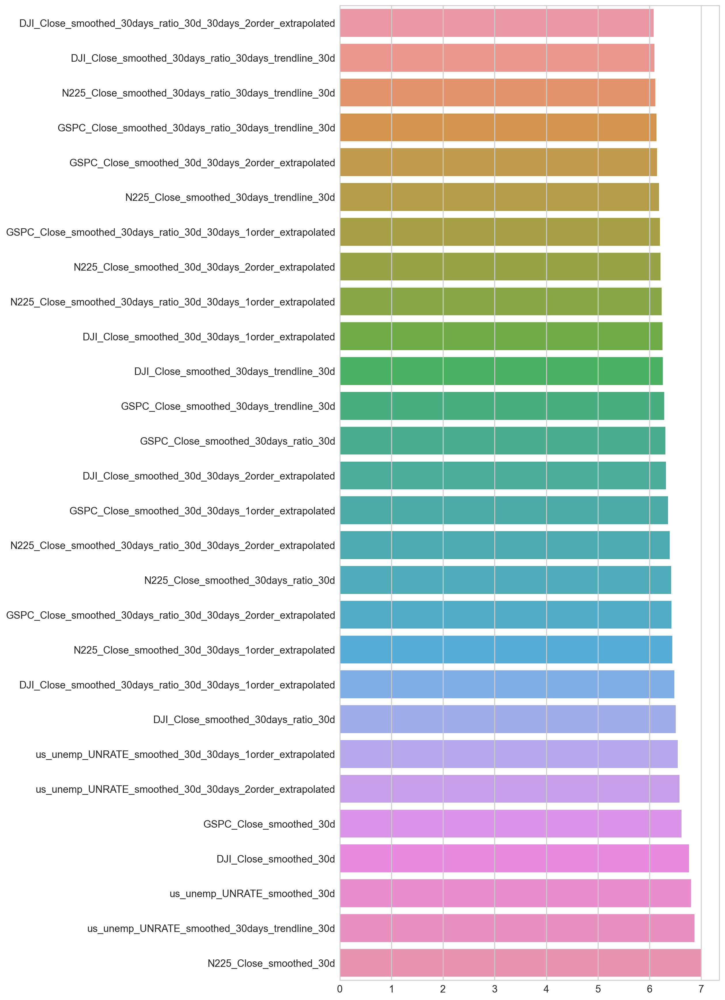

In [13]:
feat_rank=np.log10((my_pipeline.steps[1][1].feature_importances_)/max(my_pipeline.steps[1][1].feature_importances_)*1e7)
# feat_rank=np.log10((quick_model.feature_importances_)/max(quick_model.feature_importances_)*1e7)
plt.figure(figsize=(8.5,0.8*len(list(X_train.columns))), dpi=200)
pd_series = pd.Series(data=feat_rank, index= X_train.columns).sort_values()
sns.barplot(y=pd_series.index, x=pd_series.values)
print(feat_rank)


In [14]:
# pd_series[pd_series.values>3]
print((pd_series.tail(20).index))


Index(['N225_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated',
       'DJI_Close_smoothed_30d_30days_1order_extrapolated',
       'DJI_Close_smoothed_30days_trendline_30d',
       'GSPC_Close_smoothed_30days_trendline_30d',
       'GSPC_Close_smoothed_30days_ratio_30d',
       'DJI_Close_smoothed_30d_30days_2order_extrapolated',
       'GSPC_Close_smoothed_30d_30days_1order_extrapolated',
       'N225_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated',
       'N225_Close_smoothed_30days_ratio_30d',
       'GSPC_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated',
       'N225_Close_smoothed_30d_30days_1order_extrapolated',
       'DJI_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated',
       'DJI_Close_smoothed_30days_ratio_30d',
       'us_unemp_UNRATE_smoothed_30d_30days_1order_extrapolated',
       'us_unemp_UNRATE_smoothed_30d_30days_2order_extrapolated',
       'GSPC_Close_smoothed_30d', 'DJI_Close_smoothed_30d',
       'us_unemp_UNRATE_smooth

In [15]:
def adjust_slope (series):
    series=series-series[0]
    slope=series[-1]/len(series)
    for i in range(len(series)):
        series[i]=series[i]-i*slope
    return series

def local_extrema (series, tap=30, dist=30/2):
    series=adjust_slope(series)
    peaks, full_result = signal.find_peaks(series, height=(None, None),width=1,distance=dist)
    return pd.to_datetime(series.index[peaks])

def extrema_shifts (ref_series_extrema,test_series_extrema, exclude_limit=60):
    ref_series_extrema=np.array(ref_series_extrema)
    test_series_extrema=np.array(test_series_extrema)
    
    closest_ind=abs(ref_series_extrema[:, None] - test_series_extrema[None, :]).argmin(axis=-1)
    
    out_obj={}
    
    for i in closest_ind:
        lowest_pos=abs(ref_series_extrema[closest_ind==i] - test_series_extrema[i]).argmin(axis=-1)
        lag=-1*(ref_series_extrema[closest_ind==i][lowest_pos]-test_series_extrema[i]) / np.timedelta64(1, 'D')
        if lag <= exclude_limit:
            out_obj[str(ref_series_extrema[closest_ind==i][lowest_pos])[:10]]=lag
            
    out_df=pd.Series(out_obj, name = 'Days Delayed').to_frame()
    print(f"The average delay around the peaks are {round(out_df['Days Delayed'].mean(),3)} days")
    print(f"The median delay around the peaks are {round(out_df['Days Delayed'].median(),3)} days")
    display(out_df)
    return out_df


def plot_results(model, X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03',\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance):
    
    preds=model.predict(X_valid)
    
    return plot_preds_results(preds, y_valid, start_time=start_time, end_time=end_time,\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance)

def plot_preds_results(preds, y_valid, start_time='2017-01-01', end_time='2020-01-03',\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance):
    
    valid_result=y_valid.to_frame()
    valid_result['preds']=preds

    plot_valid_result=valid_result

    plot_start_date= pd.to_datetime(start_time)
    plot_end_date= pd.to_datetime(end_time)

    plot_valid_result=plot_valid_result[plot_valid_result.index>=plot_start_date]
    plot_valid_result=plot_valid_result[plot_valid_result.index<=plot_end_date]


    sns.set_style("whitegrid")

    plt.figure(figsize=(11,8.5), dpi=600)

    sns.lineplot(data=plot_valid_result)

#     plt.show()


    plot_valid_result_new=plot_valid_result.copy()
    plot_valid_result_new['GSPC_Close_smoothed']=smooth_data(econ_data_ori,['GSPC_Close'],prediction_distance)['GSPC_Close_smoothed']
    plot_valid_result_new['GSPC_Close']=(econ_data_ori['GSPC_Close'])


    plot_valid_result_new['preds']=plot_valid_result_new['GSPC_Close_smoothed'].shift(periods=int(prediction_distance))*(plot_valid_result_new['preds']/100+1)

    plot_valid_result_new[target]=plot_valid_result_new['GSPC_Close_smoothed'].shift(periods=int(prediction_distance))*(plot_valid_result_new[target]/100+1)

    plot_valid_result_new=plot_valid_result_new.dropna()


    sns.set_style("whitegrid")

    p_diff_err(plot_valid_result_new[target], plot_valid_result_new['preds'])

#     diff_err_scorer(plot_valid_result_new[target], plot_valid_result_new['preds'])

    plt.figure(figsize=(11,8.5), dpi=600)


    plot_cols=plot_valid_result_new.loc[:, plot_valid_result_new.columns != target]
    plot_cols=plot_cols.columns

#     sns.lineplot(data=plot_valid_result_new.loc[:, plot_cols],hue_order=(['preds']+[ e for e in plot_cols if e is not 'preds' ]))
    sns.lineplot(data=plot_valid_result_new.loc[:, plot_cols],hue_order=([ e for e in plot_cols if e is not 'preds' ]+['preds']))

    valid_price_score = mean_absolute_error(plot_valid_result_new[target], plot_valid_result_new['preds'])
    print(valid_price_score)

    
    sns.set_style("whitegrid")
    
    plt.show()
    
    # modified from https://stackoverflow.com/questions/41492882/find-time-shift-of-two-signals-using-cross-correlation 
    def lag_finder(y1, y2, sr):
        n = len(y1)

        corr = signal.correlate(y2, y1, mode='same') / np.sqrt(signal.correlate(y1, y1, mode='same')[int(n/2)] * signal.correlate(y2, y2, mode='same')[int(n/2)])

        delay_arr = np.linspace(-0.5*n/sr, 0.5*n/sr, n)
        
        delay = delay_arr[np.argmax(corr)]
        print('Prediction is ' + str(delay) + ' days behind reference')

        plt.figure()
        plt.plot(delay_arr, corr)
        plt.title('Lag: ' + str(np.round(-delay, 3)) + ' days')
        plt.xlabel('Shift')
        plt.ylabel('Correlation coeff')
        plt.show()
    
    sr = 1
    y1 = adjust_slope(plot_valid_result_new['preds'])
    y2 = adjust_slope(plot_valid_result_new[target])

    lag_finder(y1, y2, sr)
    
    print("\nFor major peaks in the index:\n")
    a=local_extrema(plot_valid_result_new['preds'], prediction_distance)
    b=local_extrema(plot_valid_result_new[target], prediction_distance)

    es=extrema_shifts(b, a, exclude_limit=prediction_distance*2)

    return

In [16]:

dtrain = lgb.Dataset(train[feature_cols], label=train[target])
dvalid = lgb.Dataset(valid[feature_cols], label=valid[target])

param = {#'num_leaves': 5, 
         'learning_rate':0.04,
#          'num_iterations':1000,
#          'min_data_in_leaf':10,
#          'boosting' : 'dart',
         'max_bin' : 100,
        }
param['metric'] = 'regression_l2'
num_round = 2000


bst = lgb.train(param, dtrain, num_round, valid_sets=[dvalid], early_stopping_rounds=150, verbose_eval=False)

from sklearn import metrics
ypred = bst.predict(test[feature_cols])
score = metrics.mean_absolute_error(test[target], ypred)

print(f"Test MAE score: {score}")

score=[]



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2800
[LightGBM] [Info] Number of data points in the train set: 10013, number of used features: 28
[LightGBM] [Info] Start training from score 0.715585
Test MAE score: 2.1930769928559113


The absolut error is 2.337%
62.733419904311226


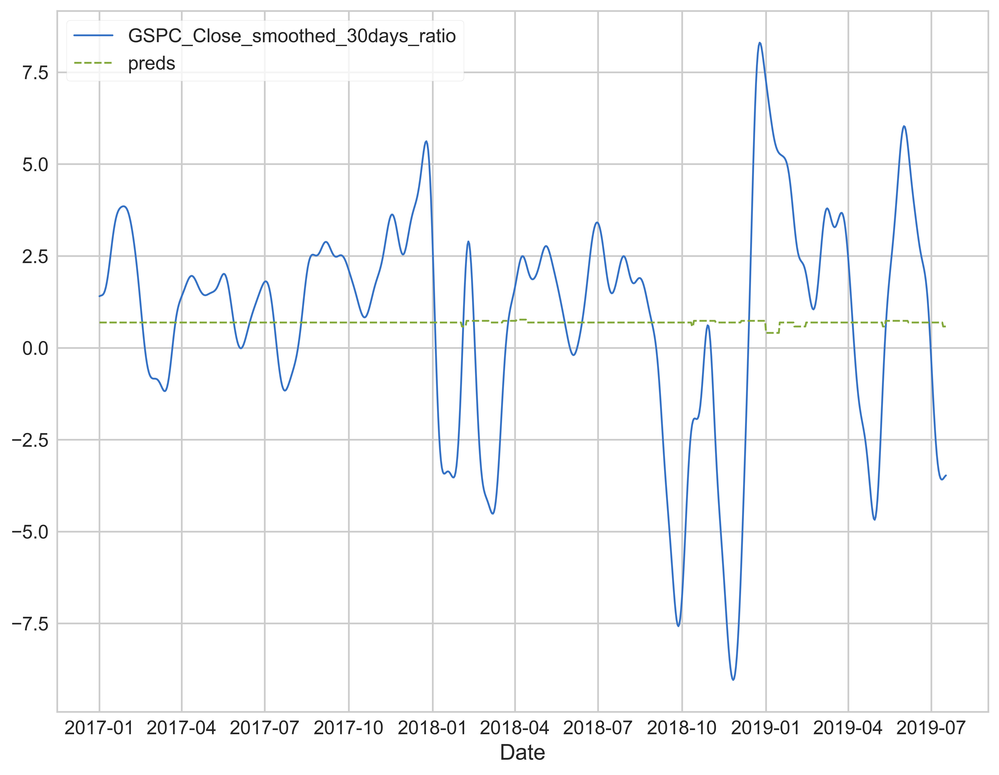

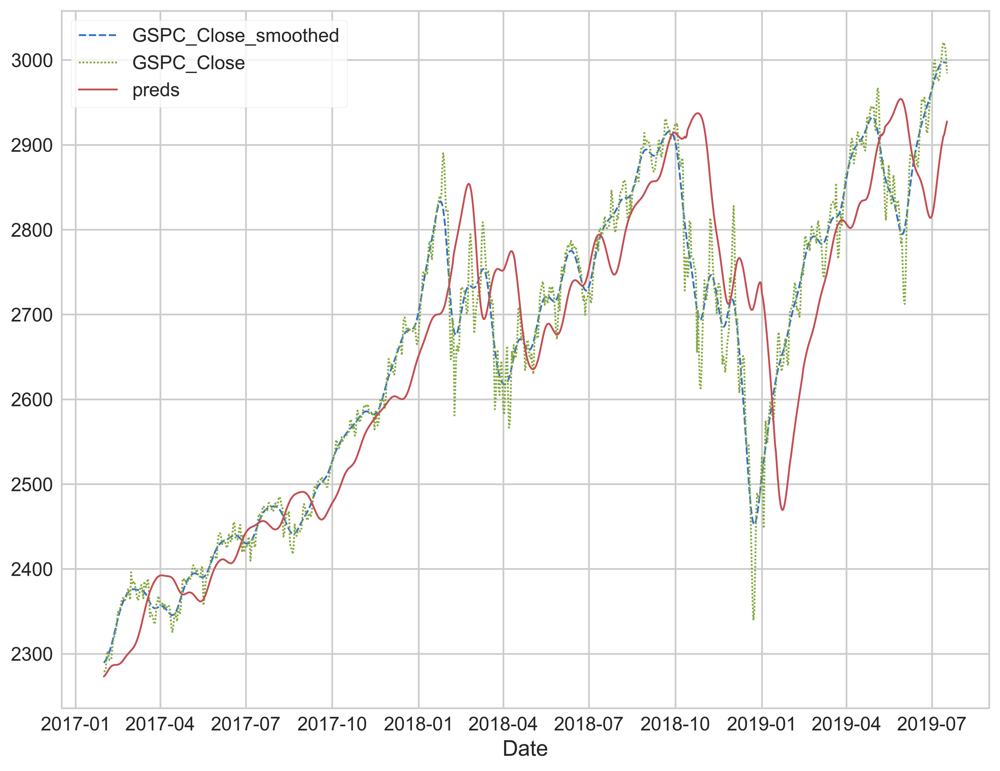

Prediction is 1.5016722408026908 days behind reference


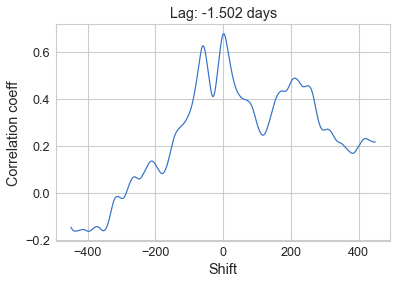


For major peaks in the index:

The average delay around the peaks are 2.867 days
The median delay around the peaks are 2.0 days


,Days Delayed
2017-04-10,-11.0
2017-05-22,13.0
2017-07-03,2.0
2017-09-03,-12.0
2017-11-18,16.0
2018-01-18,0.0
2018-02-10,13.0
2018-04-09,0.0
2018-05-15,3.0
2018-07-05,6.0


In [17]:
plot_results(bst, X_test, y_test, start_time='2017-01-01', end_time='2020-01-03')

In [18]:
my_model = XGBRegressor(n_estimators=999, learning_rate=0.01, n_jobs=8,tree_method='exact',min_child_weight=1,subsample=0.5)
my_model.fit(X_train, y_train, 
             early_stopping_rounds=10, 
             eval_set=[(X_valid, y_valid)], 
             verbose=False,
             eval_metric = "mae",
             
             )

predictions = my_model.predict(X_valid)
print("Mean Absolute Error: " + str(mean_absolute_error(predictions, y_valid)))

Mean Absolute Error: 2.2542285497649317


                                                     0
DJI_Close_smoothed_30days_trendline_30d              2
N225_Close_smoothed_30d_30days_2order_extrapolated   3
GSPC_Close_smoothed_30days_trendline_30d             4
DJI_Close_smoothed_30days_ratio_30d_30days_2ord...   5
DJI_Close_smoothed_30d_30days_2order_extrapolated    6
GSPC_Close_smoothed_30d_30days_2order_extrapolated   6
DJI_Close_smoothed_30d_30days_1order_extrapolated    7
GSPC_Close_smoothed_30days_ratio_30days_trendli...   7
GSPC_Close_smoothed_30d_30days_1order_extrapolated   7
GSPC_Close_smoothed_30days_ratio_30d_30days_1or...   7
GSPC_Close_smoothed_30days_ratio_30d_30days_2or...   9
N225_Close_smoothed_30days_ratio_30days_trendli...   9
N225_Close_smoothed_30days_trendline_30d             9
N225_Close_smoothed_30days_ratio_30d_30days_1or...  10
DJI_Close_smoothed_30days_ratio_30days_trendlin...  10
N225_Close_smoothed_30days_ratio_30d_30days_2or...  10
us_unemp_UNRATE_smoothed_30d_30days_1order_extr...  11
DJI_Close_

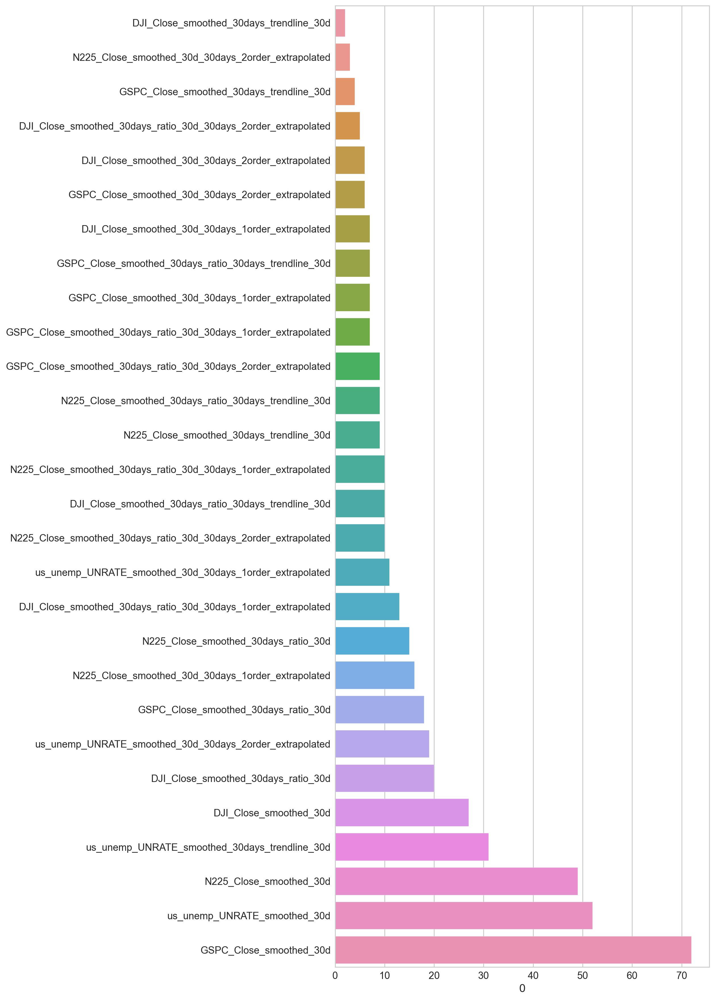

In [19]:
f_score=my_model.get_booster().get_fscore()
keys = list(f_score.keys())
values = list(f_score.values())

feat_rank=pd.DataFrame(data=values, index=keys).sort_values(by=0)
# feat_rank=np.log10((quick_model.feature_importances_)/max(quick_model.feature_importances_)*1e7)
plt.figure(figsize=(8.5,0.8*len(list(X_train.columns))), dpi=200)
# pd_series = pd.Series(data=feat_rank).sort_values()
sns.barplot(y=feat_rank.index, x=feat_rank[0])
print(feat_rank)
# bst.get_fscore()
# fscore = fimp_xgb_model.booster().get_fscore()

The absolut error is 2.386%
64.06192295639669


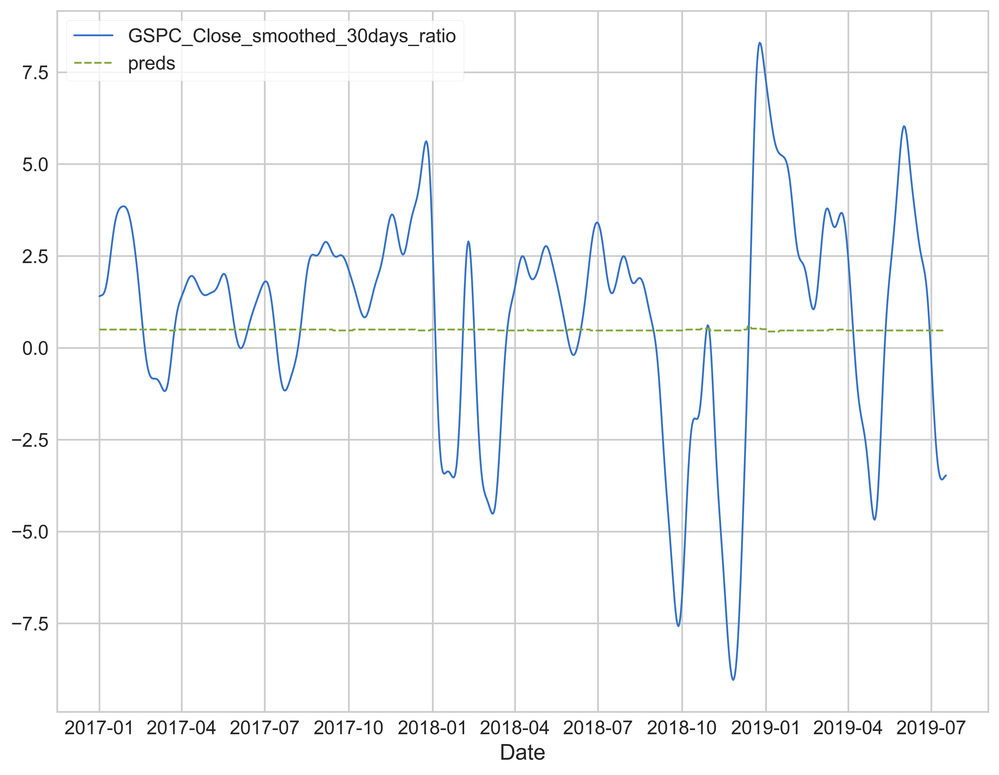

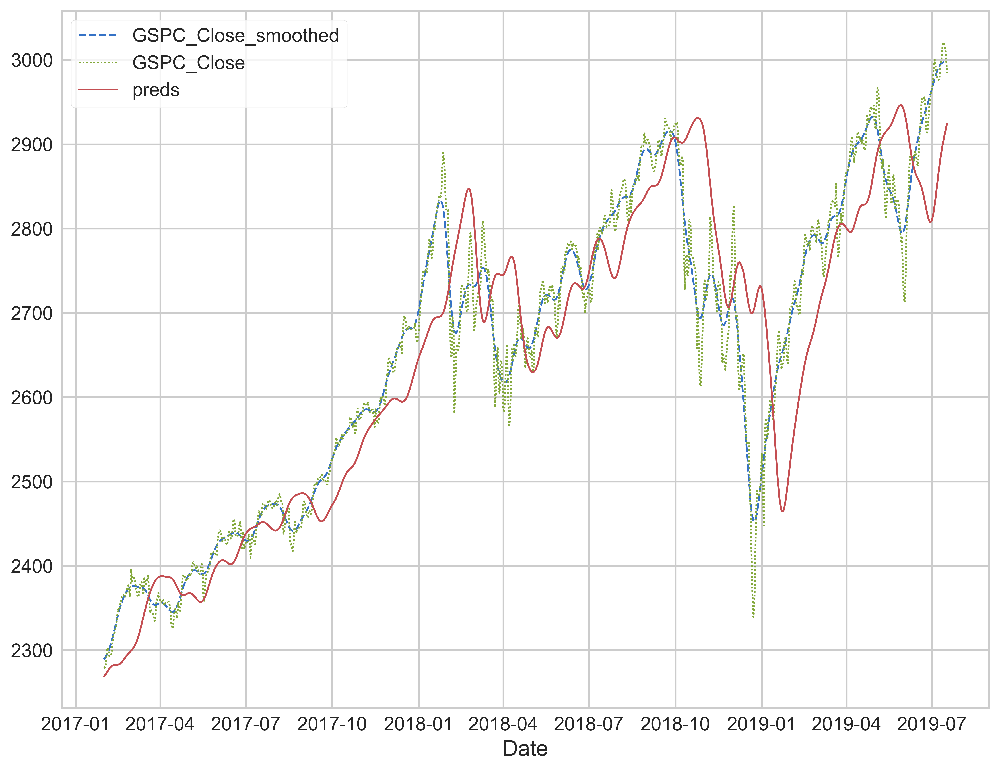

Prediction is 1.5016722408026908 days behind reference


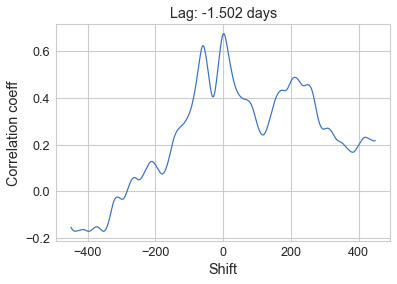


For major peaks in the index:

The average delay around the peaks are 2.867 days
The median delay around the peaks are 2.0 days


,Days Delayed
2017-04-10,-11.0
2017-05-22,13.0
2017-07-03,2.0
2017-09-03,-12.0
2017-11-18,16.0
2018-01-18,0.0
2018-02-10,13.0
2018-04-09,0.0
2018-05-15,3.0
2018-07-05,6.0


In [20]:
plot_results(my_model,X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03')


In [21]:
gbr_model=GradientBoostingRegressor(n_estimators=1000, learning_rate=0.01,random_state=1)
gbr_model.fit(X_train, y_train)
gbr_model_preds = gbr_model.predict(X_valid)
print(mean_absolute_error(y_valid, gbr_model_preds))

3.169108814167213


The absolut error is 2.838%
76.57548253624833


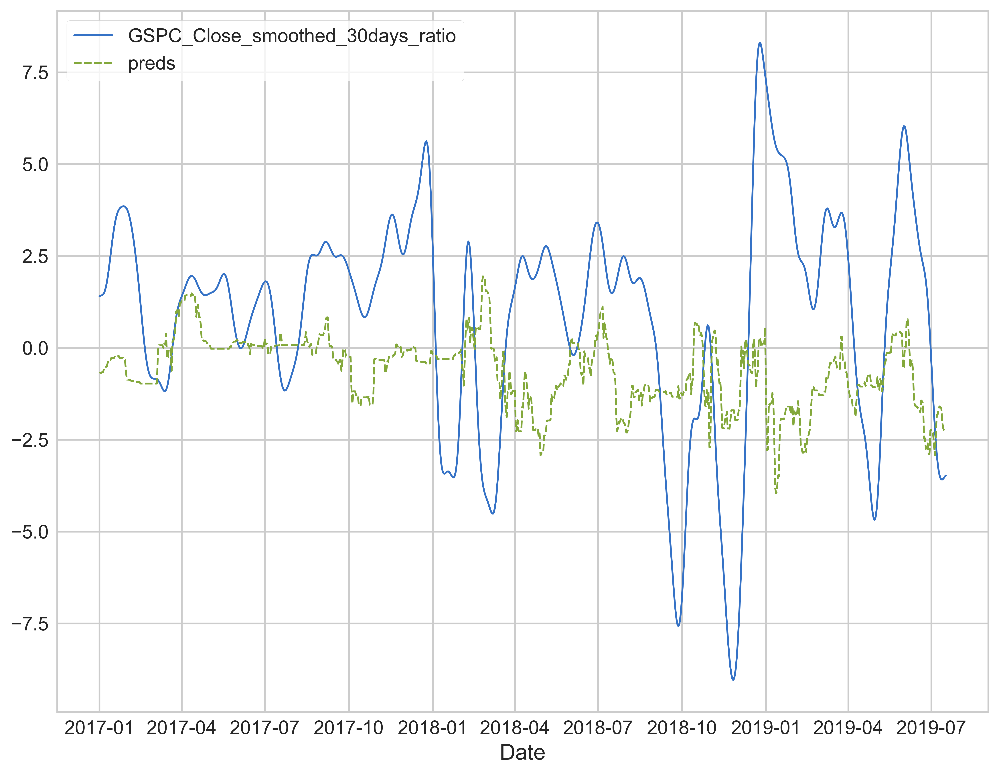

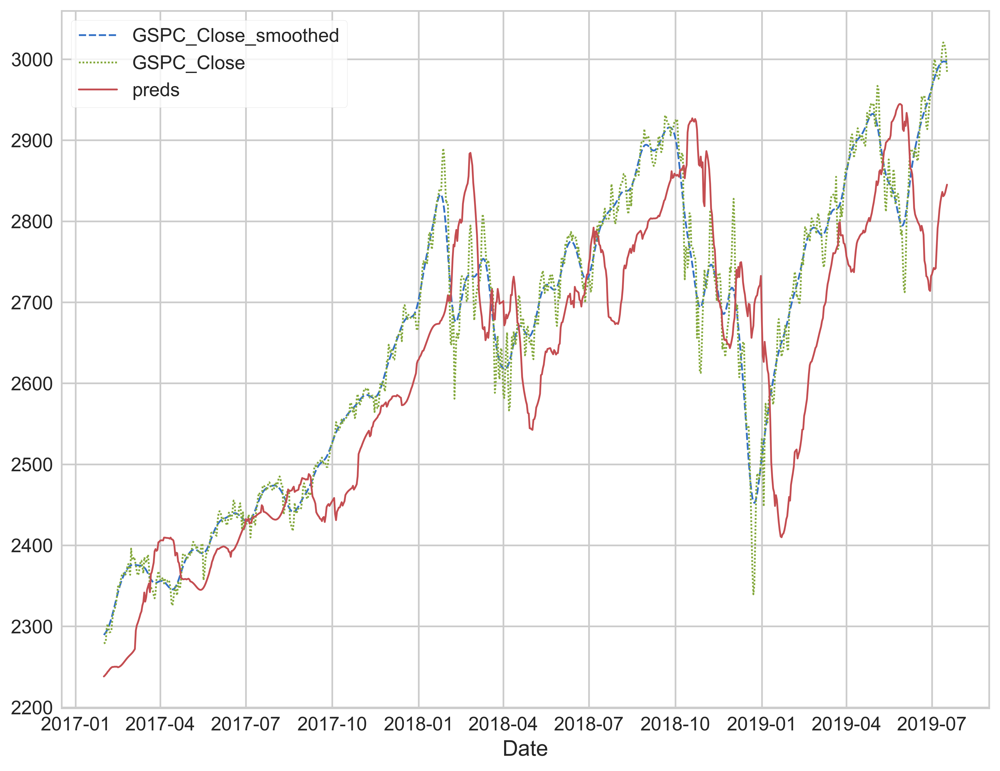

Prediction is 2.5027870680044657 days behind reference


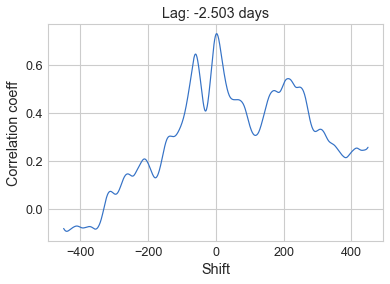


For major peaks in the index:

The average delay around the peaks are -0.471 days
The median delay around the peaks are 1.0 days


,Days Delayed
2017-04-10,-5.0
2017-05-22,10.0
2017-07-03,-2.0
2017-09-03,3.0
2017-09-28,5.0
2017-11-18,-9.0
2017-12-26,-22.0
2018-01-18,1.0
2018-02-10,0.0
2018-04-09,3.0


In [22]:
plot_results(gbr_model, X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03')


In [23]:
def add_preds(df,train_data):
    df['RandomForest']=model.predict(train_data.fillna(0))
    df['XGB_model']=my_model.predict(train_data.fillna(0))
    df['lgb_model']=bst.predict(train_data.fillna(0))
    df['gbr_model']=gbr_model.predict(train_data.fillna(0))
    return df

def preds_only(df,train_data):
    out_df=pd.DataFrame()
    out_df['RandomForest']=model.predict(train_data.fillna(0))
    out_df['XGB_model']=my_model.predict(train_data.fillna(0))
    out_df['lgb_model']=bst.predict(train_data.fillna(0))
    out_df['gbr_model']=gbr_model.predict(train_data.fillna(0))
    out_df.index=df.index
    return out_df

<AxesSubplot:xlabel='Date'>

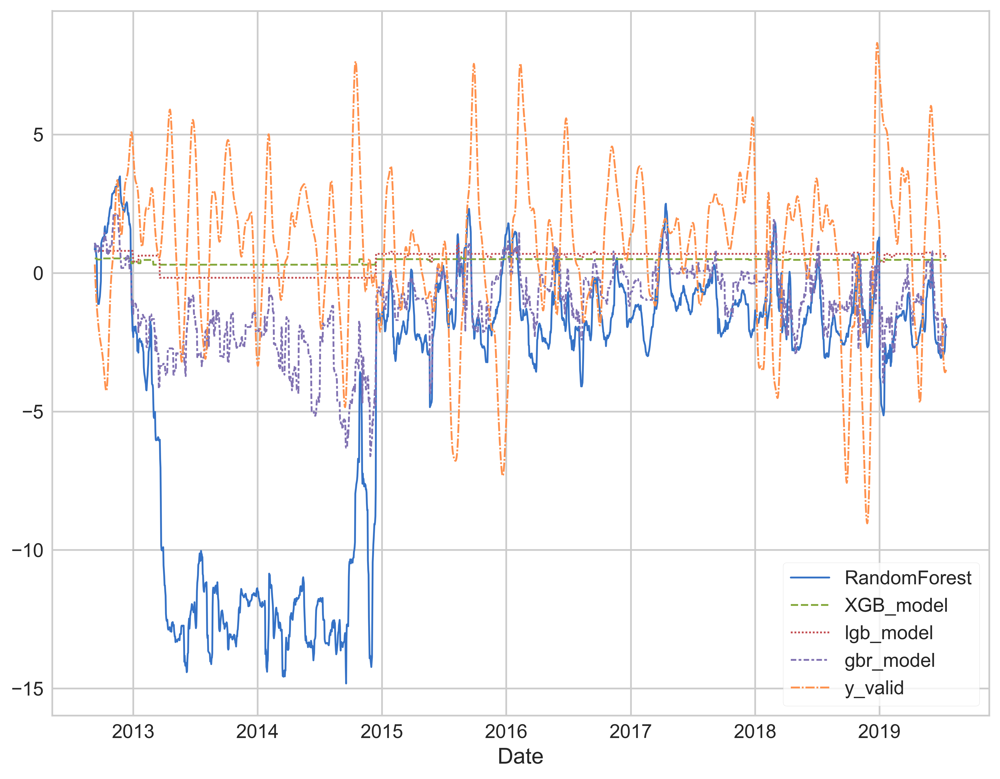

In [24]:
composed_X_train=add_preds(X_train.copy(),X_train.copy())
composed_X_valid=add_preds(X_valid.copy(),X_valid.copy())

plt.figure(figsize=(11,8.5), dpi=600)

all_preds=preds_only(X_valid.copy(),X_valid.copy())
all_y=all_preds.copy()
all_y["y_valid"]=y_valid

sns.lineplot(data=all_y)

In [25]:






# composed_model = XGBRegressor(n_estimators=100, learning_rate=0.1, n_jobs=8)
# composed_model.fit(composed_X_train, y_train, 
#              early_stopping_rounds=10, 
#              eval_set=[(composed_X_valid, y_valid)], 
#              verbose=False,
#              eval_metric = "mae",
             
#              )

# composed_model=GradientBoostingRegressor(n_estimators=1000, learning_rate=0.01,random_state=1)

composed_model=RandomForestRegressor()
composed_model.fit(composed_X_train, y_train)
composed_model_preds = composed_model.predict(composed_X_valid)


predictions = composed_model.predict(composed_X_valid)
print("Mean Absolute Error: " + str(mean_absolute_error(predictions, y_valid)))

Mean Absolute Error: 5.921882793712733


The absolut error is 2.628%
70.75723220158423


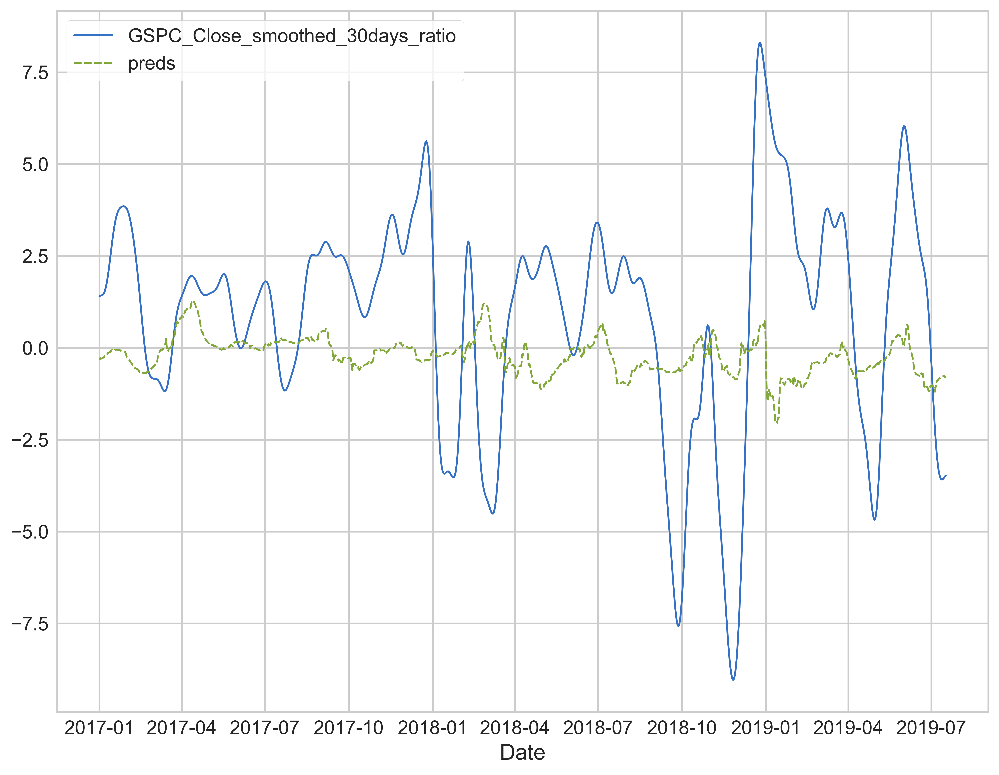

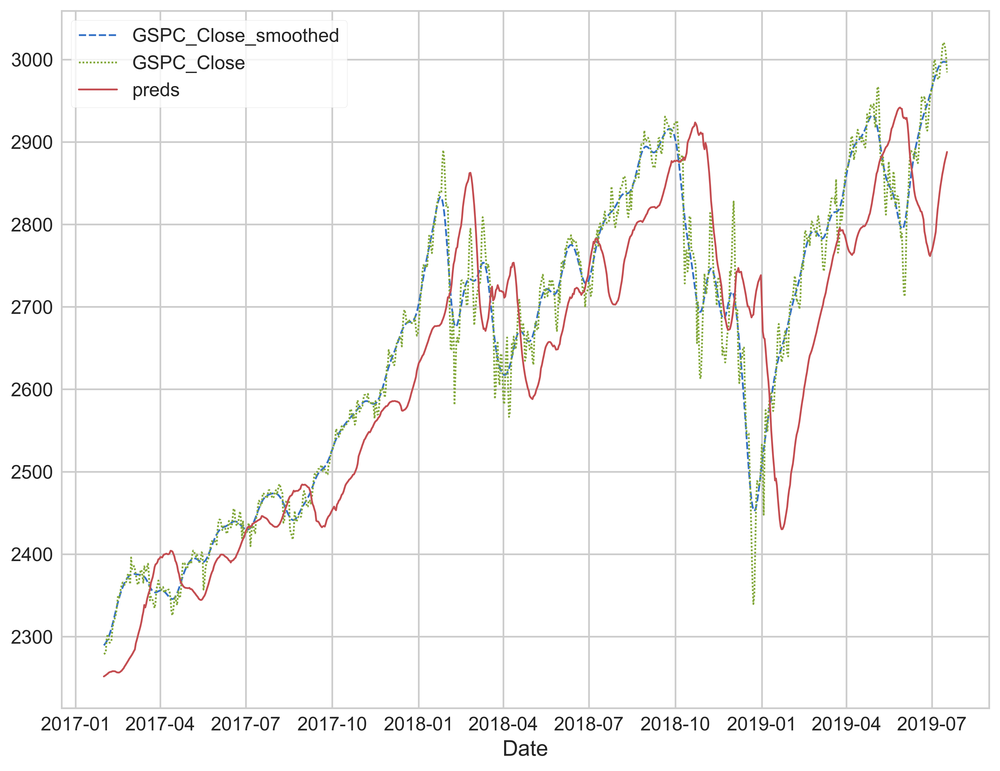

Prediction is 2.5027870680044657 days behind reference


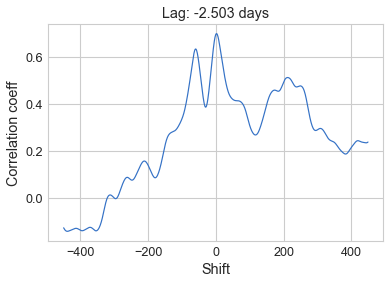


For major peaks in the index:

The average delay around the peaks are 1.562 days
The median delay around the peaks are 2.5 days


,Days Delayed
2017-04-10,-5.0
2017-05-22,13.0
2017-07-03,15.0
2017-09-03,-4.0
2017-09-28,5.0
2017-11-18,-9.0
2017-12-26,-24.0
2018-02-10,14.0
2018-04-09,2.0
2018-05-15,4.0


In [26]:
plot_preds_results(all_preds.mean(axis=1), y_valid)